In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

from IPython.display import display, display_markdown

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import subprocess as sp
import numpy as np
import pandas as pd
import seaborn as sns
import arviz as az
import bambi
from copy import deepcopy

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['figure.dpi'] = 150

from subs2vec.utensils import log_timer
from subs2vec.vecs import Vectors
from subs2vec.neighbors import compute_nn

import logging
logging.getLogger().setLevel(logging.WARNING)

def display_md(md, **kwargs):
    return display_markdown(md, raw=True, **kwargs)

def convert_notebook(title, output='html'):
    convert = sp.run(f'jupyter nbconvert {title}.ipynb --to {output} --output {title}.{output}'.split(' '))
    if convert.returncode == 0:
        display_md(f'Jupyter notebook `{title}` converted successfully.')
    else:
        display_md(f'Error: encountered problem converting Jupyter notebook `{title}`')

def norm(x):
    return x / np.linalg.norm(x, 2)

def standardize(x):
    return (x - x.mean()) / x.std()

sns.set(style='whitegrid')
pd.options.mode.chained_assignment = None

# Loading and preparing data

In [2]:
df_joint = pd.read_csv('data/data_plus_predictors.tsv', sep='\t')
display(df_joint)

,index,group,dimension,pp_id,color,rating,experiment,self_vs_other,art,fiction,...,sighted,group_eff,group_z,original,replication_1,replication_2,other,self,self_vs_other_eff,self_vs_other_z
0,0,sighted,cold-hot,sighted_1,white,1,original,self,NaN,NaN,...,1,1.0,0.211241,1,0,0,0,1,-1.0,-0.891882
1,1,sighted,ripe-unripe,sighted_1,white,7,original,self,NaN,NaN,...,1,1.0,0.211241,1,0,0,0,1,-1.0,-0.891882
2,2,sighted,new-old,sighted_1,white,1,original,self,NaN,NaN,...,1,1.0,0.211241,1,0,0,0,1,-1.0,-0.891882
3,3,sighted,submissive-aggressive,sighted_1,white,1,original,self,NaN,NaN,...,1,1.0,0.211241,1,0,0,0,1,-1.0,-0.891882
4,4,sighted,selfless-jealous,sighted_1,white,1,original,self,NaN,NaN,...,1,1.0,0.211241,1,0,0,0,1,-1.0,-0.891882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42975,28507,sighted,light-heavy,sighted_68129,red,5,replication_2,other,11.0,0.0,...,1,1.0,0.211241,0,0,1,1,0,1.0,1.121199
42976,28508,sighted,relaxed-tense,sighted_68129,red,5,replication_2,other,11.0,0.0,...,1,1.0,0.211241,0,0,1,1,0,1.0,1.121199
42977,28509,sighted,alive-dead,sighted_68129,red,6,replication_2,other,11.0,0.0,...,1,1.0,0.211241,0,0,1,1,0,1.0,1.121199
42978,28510,sighted,fast-slow,sighted_68129,red,3,replication_2,other,11.0,0.0,...,1,1.0,0.211241,0,0,1,1,0,1.0,1.121199


In [3]:
corr = df_joint[[
    'cosine_fic_z',
    'cosine_fic_no_1st_order_z',
    'cosine_fic_no_neighbors_weak_z',
    'cosine_fic_no_neighbors_strong_z',
    'cosine_fic_no_mediators_z',
]].corr()
display(corr.round(2))

,cosine_fic_z,cosine_fic_no_1st_order_z,cosine_fic_no_neighbors_weak_z,cosine_fic_no_neighbors_strong_z,cosine_fic_no_mediators_z
cosine_fic_z,1.00,0.92,0.86,0.75,0.41
cosine_fic_no_1st_order_z,0.92,1.00,0.86,0.79,0.43
cosine_fic_no_neighbors_weak_z,0.86,0.86,1.00,0.75,0.48
cosine_fic_no_neighbors_strong_z,0.75,0.79,0.75,1.00,0.44
cosine_fic_no_mediators_z,0.41,0.43,0.48,0.44,1.00


# Differences between modified versions of the COCA-fiction corpus

## COCA-fiction

In [4]:
m_fic = bambi.Model('rating_z ~ 1'
    + ' + group_eff*frequency_z'
    + ' + group_eff*concreteness_z'
    + ' + group_eff*cosine_fic_z'
    + ' + group_eff*swow_all_z'
    + ' + (1 + frequency_z + concreteness_z + cosine_fic_z + swow_all_z|pp_id)'
    + ' + (1 + group_eff|dimension)'
    + ' + (1 + group_eff|color)',
    df_joint[df_joint['self_vs_other'] == 'self']
)
r_fic = m_fic.fit(
    init='advi+adapt_diag',
    chains=4,
    draws=1000,
    tune=1000,
    n_init=10000,
    target_accept=.95,
)

Auto-assigning NUTS sampler...
[INFO] Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
[INFO] Initializing NUTS using advi+adapt_diag...


Finished [100%]: Average Loss = 42,754
[INFO] Finished [100%]: Average Loss = 42,754
Multiprocess sampling (4 chains in 4 jobs)
[INFO] Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_z, group_eff:cosine_fic_z, swow_all_z, group_eff:swow_all_z, 1|pp_id_sigma, 1|pp_id_offset, frequency_z|pp_id_sigma, frequency_z|pp_id_offset, concreteness_z|pp_id_sigma, concreteness_z|pp_id_offset, cosine_fic_z|pp_id_sigma, cosine_fic_z|pp_id_offset, swow_all_z|pp_id_sigma, swow_all_z|pp_id_offset, 1|dimension_sigma, 1|dimension_offset, group_eff|dimension_sigma, group_eff|dimension_offset, 1|color_sigma, 1|color_offset, group_eff|color_sigma, group_eff|color_offset, rating_z_sigma]
[INFO] NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_z, group_eff:cosine_fic_z, swow_all_z, group_eff:swow_all_z, 1|pp_id_sigma, 1|pp_id_offse

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1976 seconds.
[INFO] Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1976 seconds.


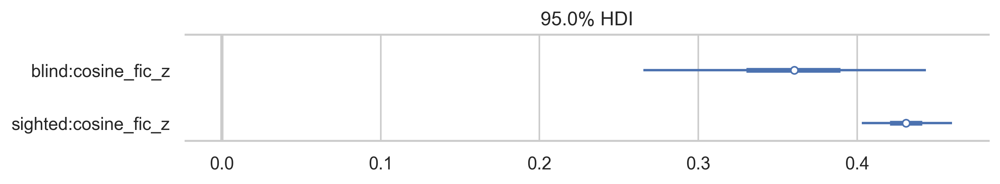

In [5]:
# compute and plot conditional effect of cosine in sighted and blind groups
trace = deepcopy(r_fic.posterior)
# effect of cosine in blind group in orginal experiment
trace['blind:cosine_fic_z'] = trace['cosine_fic_z'] - trace['group_eff:cosine_fic_z']
    # effect of cosine in sighted group across both experiments
trace['sighted:cosine_fic_z'] = trace['cosine_fic_z'] + trace['group_eff:cosine_fic_z']

varnames = ['blind:cosine_fic_z', 'sighted:cosine_fic_z']
g = az.plot_forest(trace, combined=True, hdi_prob=.95,
                   figsize=[9, .6 + len(varnames) * .3],
                   var_names=varnames)
g[0].axvline(0, color='.8', linewidth=2);

## COCA-fiction without 1st order cooccurrence of color and dimension words

In [6]:
m_fic_filtered = bambi.Model('rating_z ~ 1'
    + ' + group_eff*frequency_z'
    + ' + group_eff*concreteness_z'
    + ' + group_eff*cosine_fic_no_1st_order_z'
    + ' + group_eff*swow_all_z'
    + ' + (1 + frequency_z + concreteness_z + cosine_fic_no_1st_order_z + swow_all_z|pp_id)'
    + ' + (1 + group_eff|dimension)'
    + ' + (1 + group_eff|color)',
    df_joint[df_joint['self_vs_other'] == 'self']
)
r_fic_filtered = m_fic_filtered.fit(
    init='advi+adapt_diag',
    chains=4,
    draws=1000,
    tune=1000,
    n_init=10000,
    target_accept=.95,
)

Auto-assigning NUTS sampler...
[INFO] Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
[INFO] Initializing NUTS using advi+adapt_diag...


Finished [100%]: Average Loss = 42,645
[INFO] Finished [100%]: Average Loss = 42,645
Multiprocess sampling (4 chains in 4 jobs)
[INFO] Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_1st_order_z, group_eff:cosine_fic_no_1st_order_z, swow_all_z, group_eff:swow_all_z, 1|pp_id_sigma, 1|pp_id_offset, frequency_z|pp_id_sigma, frequency_z|pp_id_offset, concreteness_z|pp_id_sigma, concreteness_z|pp_id_offset, cosine_fic_no_1st_order_z|pp_id_sigma, cosine_fic_no_1st_order_z|pp_id_offset, swow_all_z|pp_id_sigma, swow_all_z|pp_id_offset, 1|dimension_sigma, 1|dimension_offset, group_eff|dimension_sigma, group_eff|dimension_offset, 1|color_sigma, 1|color_offset, group_eff|color_sigma, group_eff|color_offset, rating_z_sigma]
[INFO] NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_1st_order_z, group_eff:cosine_fic_

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1369 seconds.
[INFO] Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1369 seconds.


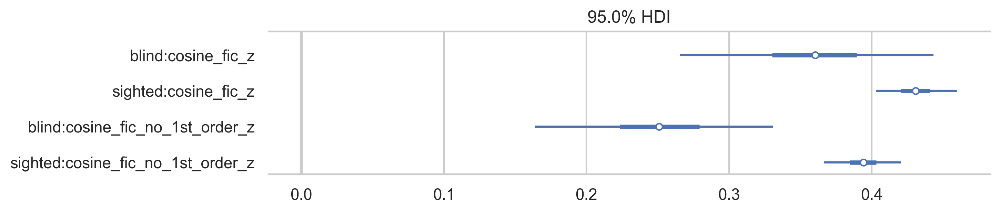

In [7]:
# compute and plot conditional effect of cosine in sighted and blind groups
trace_filtered = deepcopy(r_fic_filtered.posterior)
# effect of cosine in blind group in orginal experiment
trace['blind:cosine_fic_no_1st_order_z'] = (trace_filtered['cosine_fic_no_1st_order_z']
                                            - trace_filtered['group_eff:cosine_fic_no_1st_order_z'])
# effect of cosine in sighted group across both experiments
trace['sighted:cosine_fic_no_1st_order_z'] = (trace_filtered['cosine_fic_no_1st_order_z']
                                              + trace_filtered['group_eff:cosine_fic_no_1st_order_z'])

varnames = [
    'blind:cosine_fic_z', 'sighted:cosine_fic_z',
    'blind:cosine_fic_no_1st_order_z', 'sighted:cosine_fic_no_1st_order_z',
]
g = az.plot_forest(trace, combined=True, hdi_prob=.95,
                   figsize=[9, .6 + len(varnames) * .3],
                   var_names=varnames)
g[0].axvline(0, color='.8', linewidth=2);

## COCA-fiction without 25 nearest neighbors of each dimension word, weak and strong methods

In [8]:
m_fic_noneighbors_weak = bambi.Model('rating_z ~ 1'
    + ' + group_eff*frequency_z'
    + ' + group_eff*concreteness_z'
    + ' + group_eff*cosine_fic_no_neighbors_weak_z'
    + ' + group_eff*swow_all_z'
    + ' + (1 + frequency_z + concreteness_z + cosine_fic_no_neighbors_weak_z + swow_all_z|pp_id)'
    + ' + (1 + group_eff|dimension)'
    + ' + (1 + group_eff|color)',
    df_joint[df_joint['self_vs_other'] == 'self']
)
r_fic_noneighbors_weak = m_fic_noneighbors_weak.fit(
    init='advi+adapt_diag',
    chains=4,
    draws=1000,
    tune=1000,
    n_init=10000,
    target_accept=.95,
)

Auto-assigning NUTS sampler...
[INFO] Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
[INFO] Initializing NUTS using advi+adapt_diag...


Finished [100%]: Average Loss = 42,774
[INFO] Finished [100%]: Average Loss = 42,774
Multiprocess sampling (4 chains in 4 jobs)
[INFO] Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_neighbors_weak_z, group_eff:cosine_fic_no_neighbors_weak_z, swow_all_z, group_eff:swow_all_z, 1|pp_id_sigma, 1|pp_id_offset, frequency_z|pp_id_sigma, frequency_z|pp_id_offset, concreteness_z|pp_id_sigma, concreteness_z|pp_id_offset, cosine_fic_no_neighbors_weak_z|pp_id_sigma, cosine_fic_no_neighbors_weak_z|pp_id_offset, swow_all_z|pp_id_sigma, swow_all_z|pp_id_offset, 1|dimension_sigma, 1|dimension_offset, group_eff|dimension_sigma, group_eff|dimension_offset, 1|color_sigma, 1|color_offset, group_eff|color_sigma, group_eff|color_offset, rating_z_sigma]
[INFO] NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_neighbors_weak

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1378 seconds.
[INFO] Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1378 seconds.


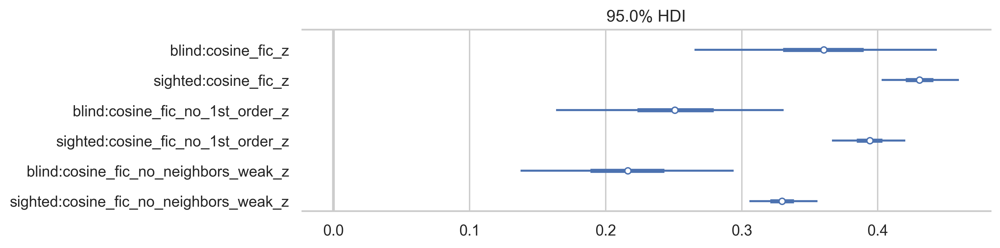

In [9]:
# compute and plot conditional effect of cosine in sighted and blind groups
trace_weak = deepcopy(r_fic_noneighbors_weak.posterior)
# effect of cosine in blind group in orginal experiment
trace['blind:cosine_fic_no_neighbors_weak_z'] = (trace_weak['cosine_fic_no_neighbors_weak_z']
                                                 - trace_weak['group_eff:cosine_fic_no_neighbors_weak_z'])
# effect of cosine in sighted group across both experiments
trace['sighted:cosine_fic_no_neighbors_weak_z'] = (trace_weak['cosine_fic_no_neighbors_weak_z']
                                                   + trace_weak['group_eff:cosine_fic_no_neighbors_weak_z'])

varnames = [
    'blind:cosine_fic_z', 'sighted:cosine_fic_z',
    'blind:cosine_fic_no_1st_order_z', 'sighted:cosine_fic_no_1st_order_z',
    'blind:cosine_fic_no_neighbors_weak_z', 'sighted:cosine_fic_no_neighbors_weak_z',
]
g = az.plot_forest(trace, combined=True, hdi_prob=.95,
                   figsize=[9, .6 + len(varnames) * .3],
                   var_names=varnames)
g[0].axvline(0, color='.8', linewidth=2);

In [10]:
m_fic_noneighbors_strong = bambi.Model('rating_z ~ 1'
    + ' + group_eff*frequency_z'
    + ' + group_eff*concreteness_z'
    + ' + group_eff*cosine_fic_no_neighbors_strong_z'
    + ' + group_eff*swow_all_z'
    + ' + (1 + frequency_z + concreteness_z + cosine_fic_no_neighbors_strong_z + swow_all_z|pp_id)'
    + ' + (1 + group_eff|dimension)'
    + ' + (1 + group_eff|color)',
    df_joint[df_joint['self_vs_other'] == 'self']
)
r_fic_noneighbors_strong = m_fic_noneighbors_strong.fit(
    init='advi+adapt_diag',
    chains=4,
    draws=1000,
    tune=1000,
    n_init=10000,
    target_accept=.95,
)

Auto-assigning NUTS sampler...
[INFO] Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
[INFO] Initializing NUTS using advi+adapt_diag...


Finished [100%]: Average Loss = 42,825
[INFO] Finished [100%]: Average Loss = 42,825
Multiprocess sampling (4 chains in 4 jobs)
[INFO] Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_neighbors_strong_z, group_eff:cosine_fic_no_neighbors_strong_z, swow_all_z, group_eff:swow_all_z, 1|pp_id_sigma, 1|pp_id_offset, frequency_z|pp_id_sigma, frequency_z|pp_id_offset, concreteness_z|pp_id_sigma, concreteness_z|pp_id_offset, cosine_fic_no_neighbors_strong_z|pp_id_sigma, cosine_fic_no_neighbors_strong_z|pp_id_offset, swow_all_z|pp_id_sigma, swow_all_z|pp_id_offset, 1|dimension_sigma, 1|dimension_offset, group_eff|dimension_sigma, group_eff|dimension_offset, 1|color_sigma, 1|color_offset, group_eff|color_sigma, group_eff|color_offset, rating_z_sigma]
[INFO] NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_neighb

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1362 seconds.
[INFO] Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1362 seconds.


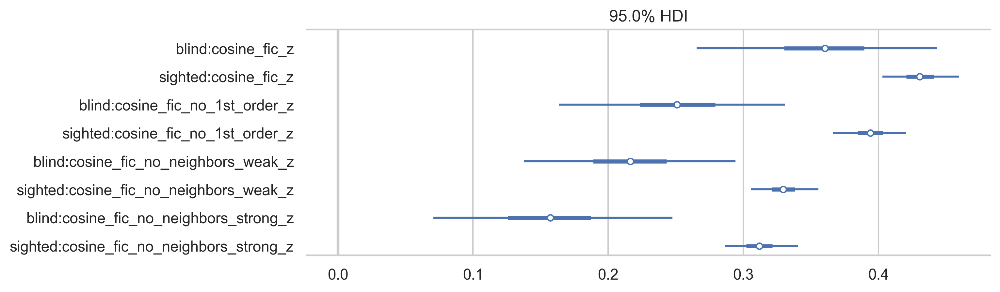

In [11]:
# compute and plot conditional effect of cosine in sighted and blind groups
trace_strong = deepcopy(r_fic_noneighbors_strong.posterior)
# effect of cosine in blind group in orginal experiment
trace['blind:cosine_fic_no_neighbors_strong_z'] = (trace_strong['cosine_fic_no_neighbors_strong_z']
                                                   - trace_strong['group_eff:cosine_fic_no_neighbors_strong_z'])
# effect of cosine in sighted group across both experiments
trace['sighted:cosine_fic_no_neighbors_strong_z'] = (trace_strong['cosine_fic_no_neighbors_strong_z']
                                                     + trace_strong['group_eff:cosine_fic_no_neighbors_strong_z'])

varnames = [
    'blind:cosine_fic_z', 'sighted:cosine_fic_z',
    'blind:cosine_fic_no_1st_order_z', 'sighted:cosine_fic_no_1st_order_z',
    'blind:cosine_fic_no_neighbors_weak_z', 'sighted:cosine_fic_no_neighbors_weak_z',
    'blind:cosine_fic_no_neighbors_strong_z', 'sighted:cosine_fic_no_neighbors_strong_z',
]
g = az.plot_forest(trace, combined=True, hdi_prob=.95,
                   figsize=[9, .6 + len(varnames) * .3],
                   var_names=varnames)
g[0].axvline(0, color='.8', linewidth=2);

## COCA-fiction without names provided by participants for color-semantic dimensions

In [12]:
m_fic_nonames = bambi.Model('rating_z ~ 1'
    + ' + group_eff*frequency_z'
    + ' + group_eff*concreteness_z'
    + ' + group_eff*cosine_fic_no_mediators_z'
    + ' + group_eff*swow_all_z'
    + ' + (1 + frequency_z + concreteness_z + cosine_fic_no_mediators_z + swow_all_z|pp_id)'
    + ' + (1 + group_eff|dimension)'
    + ' + (1 + group_eff|color)',
    df_joint[df_joint['self_vs_other'] == 'self']
)
r_fic_nonames = m_fic_nonames.fit(
    init='advi+adapt_diag',
    chains=4,
    draws=1000,
    tune=1000,
    n_init=10000,
    target_accept=.95,
)

Auto-assigning NUTS sampler...
[INFO] Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
[INFO] Initializing NUTS using advi+adapt_diag...


Finished [100%]: Average Loss = 42,638
[INFO] Finished [100%]: Average Loss = 42,638
Multiprocess sampling (4 chains in 4 jobs)
[INFO] Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_mediators_z, group_eff:cosine_fic_no_mediators_z, swow_all_z, group_eff:swow_all_z, 1|pp_id_sigma, 1|pp_id_offset, frequency_z|pp_id_sigma, frequency_z|pp_id_offset, concreteness_z|pp_id_sigma, concreteness_z|pp_id_offset, cosine_fic_no_mediators_z|pp_id_sigma, cosine_fic_no_mediators_z|pp_id_offset, swow_all_z|pp_id_sigma, swow_all_z|pp_id_offset, 1|dimension_sigma, 1|dimension_offset, group_eff|dimension_sigma, group_eff|dimension_offset, 1|color_sigma, 1|color_offset, group_eff|color_sigma, group_eff|color_offset, rating_z_sigma]
[INFO] NUTS: [Intercept, group_eff, frequency_z, group_eff:frequency_z, concreteness_z, group_eff:concreteness_z, cosine_fic_no_mediators_z, group_eff:cosine_fic_

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1001 seconds.
[INFO] Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1001 seconds.


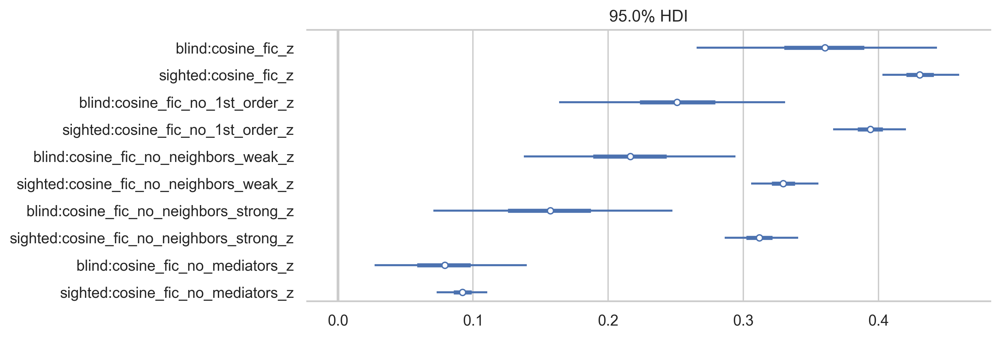

In [13]:
# compute and plot conditional effect of cosine in sighted and blind groups
trace_none = deepcopy(r_fic_nonames.posterior)
# effect of cosine in blind group in orginal experiment
trace['blind:cosine_fic_no_mediators_z'] = (trace_none['cosine_fic_no_mediators_z']
                                            - trace_none['group_eff:cosine_fic_no_mediators_z'])
# effect of cosine in sighted group across both experiments
trace['sighted:cosine_fic_no_mediators_z'] = (trace_none['cosine_fic_no_mediators_z']
                                              + trace_none['group_eff:cosine_fic_no_mediators_z'])

varnames = [
    'blind:cosine_fic_z', 'sighted:cosine_fic_z',
    'blind:cosine_fic_no_1st_order_z', 'sighted:cosine_fic_no_1st_order_z',
    'blind:cosine_fic_no_neighbors_weak_z', 'sighted:cosine_fic_no_neighbors_weak_z',
    'blind:cosine_fic_no_neighbors_strong_z', 'sighted:cosine_fic_no_neighbors_strong_z',
    'blind:cosine_fic_no_mediators_z', 'sighted:cosine_fic_no_mediators_z',
]
g = az.plot_forest(trace, combined=True, hdi_prob=.95,
                   figsize=[9, .6 + len(varnames) * .3],
                   var_names=varnames)
g[0].axvline(0, color='.8', linewidth=2);

/Users/jvparidon/.pyenv/versions/3.10.8/lib/python3.10/site-packages/seaborn/categorical.py:1728: UserWarning: You passed a edgecolor/edgecolors ((0.00392156862745098, 0.45098039215686275, 0.6980392156862745)) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(x, y, label=hue_level,
/Users/jvparidon/.pyenv/versions/3.10.8/lib/python3.10/site-packages/seaborn/categorical.py:1728: UserWarning: You passed a edgecolor/edgecolors ((0.8705882352941177, 0.5607843137254902, 0.0196078431372549)) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(x, y, label=hue_level,


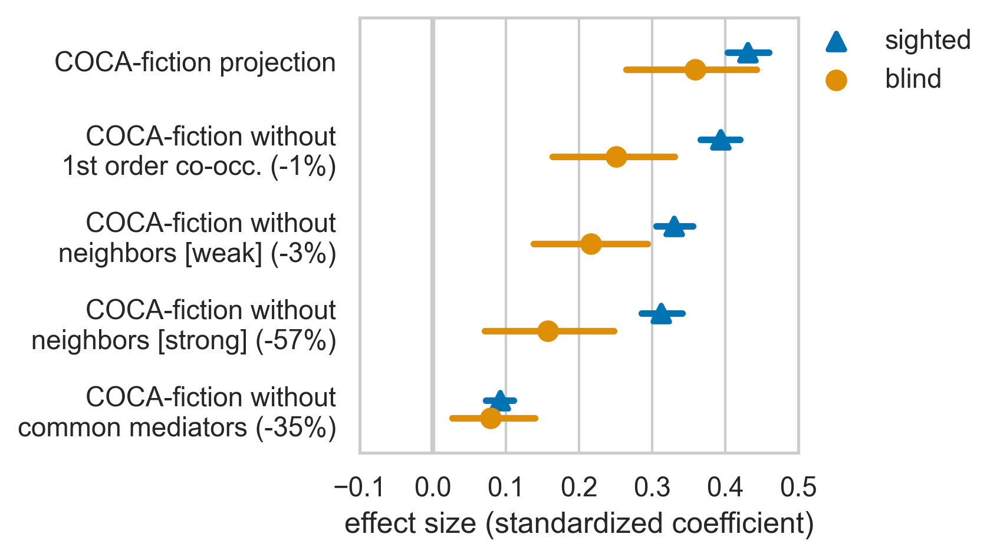

In [16]:
varnames = [
    'sighted:cosine_fic_z',
    'sighted:cosine_fic_no_1st_order_z',
    'sighted:cosine_fic_no_neighbors_weak_z',
    'sighted:cosine_fic_no_neighbors_strong_z',
    'sighted:cosine_fic_no_mediators_z',
    'blind:cosine_fic_z',
    'blind:cosine_fic_no_1st_order_z',
    'blind:cosine_fic_no_neighbors_weak_z',
    'blind:cosine_fic_no_neighbors_strong_z',
    'blind:cosine_fic_no_mediators_z',
]
trace_df = az.summary(trace, hdi_prob=.95, var_names=varnames).reset_index()
sns.set(palette='colorblind', style='whitegrid')
trace_df['group'] = trace_df['index'].apply(lambda x: x.split(':')[0])
trace_df['predictor'] = trace_df['index'].apply(lambda x: x.split(':')[1])
g, ax = plt.subplots(figsize=[3.2, 3.2])
ax.axvline(0, color='.8', linewidth=2)
order = [
    'cosine_fic_z',
    'cosine_fic_no_1st_order_z',
    'cosine_fic_no_neighbors_weak_z',
    'cosine_fic_no_neighbors_strong_z',
    'cosine_fic_no_mediators_z',
]
sns.pointplot(data=trace_df, hue='group', x='mean', y='predictor', markers=['^', 'o'],
              join=False, ax=ax, order=order,
              palette=sns.color_palette()[0:], dodge=.2)
hdi_df = trace_df.melt(id_vars=['predictor', 'group'], value_vars=['hdi_2.5%', 'hdi_97.5%'])
sns.pointplot(data=hdi_df, hue='group', markers='', x='value', order=order,
              y='predictor', ax=ax, join=False,
              palette=sns.color_palette()[0:], dodge=.2)
ax.set(xlim=[-.1, .5], xticks=[-.1, 0, .1, .2, .3, .4, .5],
       ylabel='', xlabel='effect size (standardized coefficient)',
       #title='95% CIs for embedding projections\nafter altering corpora',
       title=''
)
ax.set(yticklabels=[
    'COCA-fiction projection',
    'COCA-fiction without\n1st order co-occ. (-1%)',
    'COCA-fiction without\n neighbors [weak] (-3%)',
    'COCA-fiction without\n neighbors [strong] (-57%)',
    'COCA-fiction without\ncommon mediators (-35%)',
])
labels = ax.get_legend_handles_labels()
ax.legend(handles=labels[0][:2], labels=labels[1][:2],
          bbox_to_anchor=(1, 1), loc=2, borderaxespad=0, frameon=False)
plt.savefig('figures/corpus_modification_forest.pdf', bbox_inches='tight')

In [15]:
display(az.summary(trace, hdi_prob=.95, var_names=varnames))

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sighted:cosine_fic_z,0.431,0.015,0.403,0.460,0.000,0.000,4537.0,3411.0,1.0
sighted:cosine_fic_no_1st_order_z,0.394,0.014,0.366,0.420,0.000,0.000,4346.0,3481.0,1.0
sighted:cosine_fic_no_neighbors_weak_z,0.330,0.013,0.306,0.356,0.000,0.000,4509.0,2535.0,1.0
sighted:cosine_fic_no_neighbors_strong_z,0.312,0.014,0.286,0.341,0.000,0.000,4956.0,3255.0,1.0
sighted:cosine_fic_no_mediators_z,0.092,0.010,0.073,0.111,0.000,0.000,6533.0,3456.0,1.0
blind:cosine_fic_z,0.359,0.045,0.265,0.443,0.001,0.001,1763.0,2230.0,1.0
blind:cosine_fic_no_1st_order_z,0.251,0.043,0.164,0.331,0.001,0.001,2059.0,2070.0,1.0
blind:cosine_fic_no_neighbors_weak_z,0.216,0.040,0.138,0.294,0.001,0.001,2136.0,2257.0,1.0
blind:cosine_fic_no_neighbors_strong_z,0.157,0.046,0.071,0.248,0.001,0.001,1655.0,2214.0,1.0
blind:cosine_fic_no_mediators_z,0.079,0.029,0.027,0.140,0.001,0.000,1930.0,2490.0,1.0


## Comparing models on leave-one-out validation score
Instead of using conditional effect sizes from the models as a comparison, we can also compare the models on their out-of-sample predictive accuracy. Essentially we're looking to see which predictor, if included, makes the model _worst_.  
Using prediction/cross-validation for model comparison has distinct advantages in some situations, but in our case (when we're not varying model complexity or structure, but only replacing a single predictor) the results will probably match our inferences from the conditional effect size plots.

In [16]:
display(az.compare({
    'intact COCA fiction': r_fic,
    '1st order removed': r_fic_filtered,
    'semantic neighbors removed (weak)': r_fic_noneighbors_weak,
    'semantic neighbors removed (strong)': r_fic_noneighbors_strong,
    'salient labels removed': r_fic_nonames,
}).round(2))

/Users/jvparidon/.pyenv/versions/3.10.8/lib/python3.10/site-packages/arviz/stats/stats.py:802: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/Users/jvparidon/.pyenv/versions/3.10.8/lib/python3.10/site-packages/arviz/stats/stats.py:802: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/Users/jvparidon/.pyenv/versio

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
1st order removed,0,-32694.74,403.23,0.00,0.56,105.14,0.00,True,log
intact COCA fiction,1,-32722.68,394.34,27.94,0.44,105.08,22.39,True,log
semantic neighbors removed (weak),2,-32887.34,351.21,192.60,0.00,104.24,23.53,True,log
semantic neighbors removed (strong),3,-32981.03,353.12,286.29,0.01,104.13,28.65,True,log
salient labels removed,4,-33217.15,341.15,522.41,0.00,103.50,31.80,True,log


As expected, the no-mediator-words model fared worst, whereas filtering only first-order co-occurrences made exactly no difference with the unfiltered corpus whatsoever. (In fact, the first-order filtered model looks slightly better here, but judging by the assigned model weights it's pretty much a toss-up.)  
Removing semantic neighbors and removing salient names/labels seems to be fairly equivalent here, as well. Since removing salient labels was a much more targeted intervention (much smaller percentage of the corpus removed), that seems to have been the intervention that was most effective at identifying meaningful training samples.

The comparison algorithm does warn that the shape parameter of the pareto distribution is too large for some observations. This is common with hierarchical models and shouldn't be a problem if it concerns only a few observations. We can check this by inspecting the LOO-statistics more closely.

In [17]:
az.loo(r_fic_nonames)

/Users/jvparidon/.pyenv/versions/3.9.4/lib/python3.9/site-packages/arviz/stats/stats.py:802: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 4000 posterior samples and 23938 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -33219.13   103.52
p_loo      342.62        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     23891   99.8%
 (0.5, 0.7]   (ok)          39    0.2%
   (0.7, 1]   (bad)          8    0.0%
   (1, Inf)   (very bad)     0    0.0%

It appears that for the no labels model, for instance, there are only a few observations in the "bad" range. This is not overly problematic given the nearly 24,000 observations that are in the correct range.

## Visual model diagnostics
R-hat and other Markov chain diagnostics looked good, but it's still worth doing a few quick visual model checks.
### Quick look at the trace plots
We want all the Markov chains for a single variable to look lined up in the density plot on the left, but nice and fuzzy (i.e. not autocorrelated) on the right.

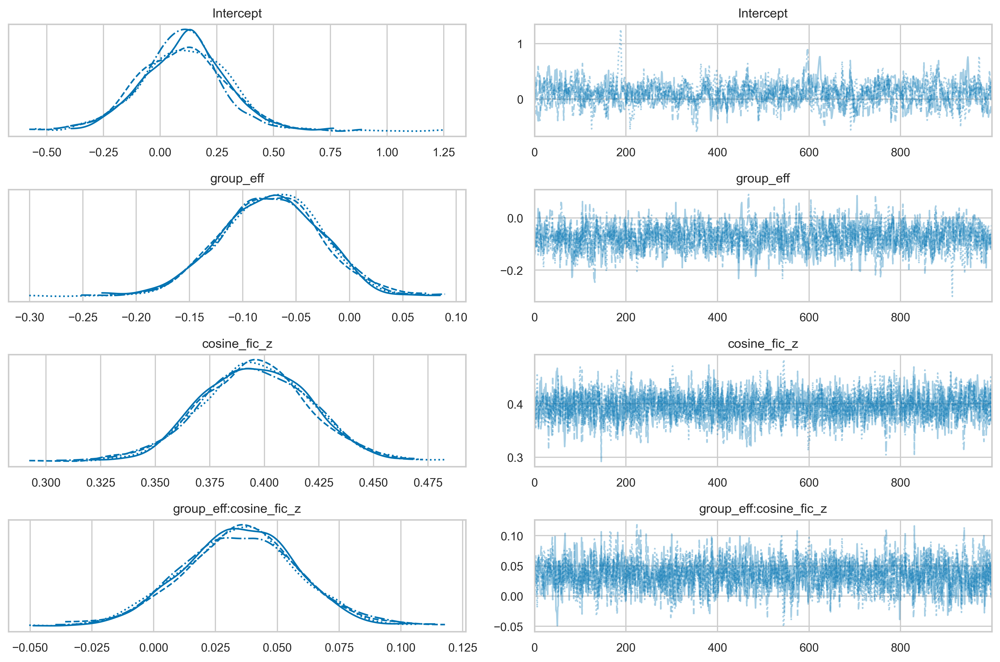

In [18]:
g = az.plot_trace(r_fic, var_names=['Intercept', 'group_eff', 'cosine_fic_z', 'group_eff:cosine_fic_z'])
plt.tight_layout()

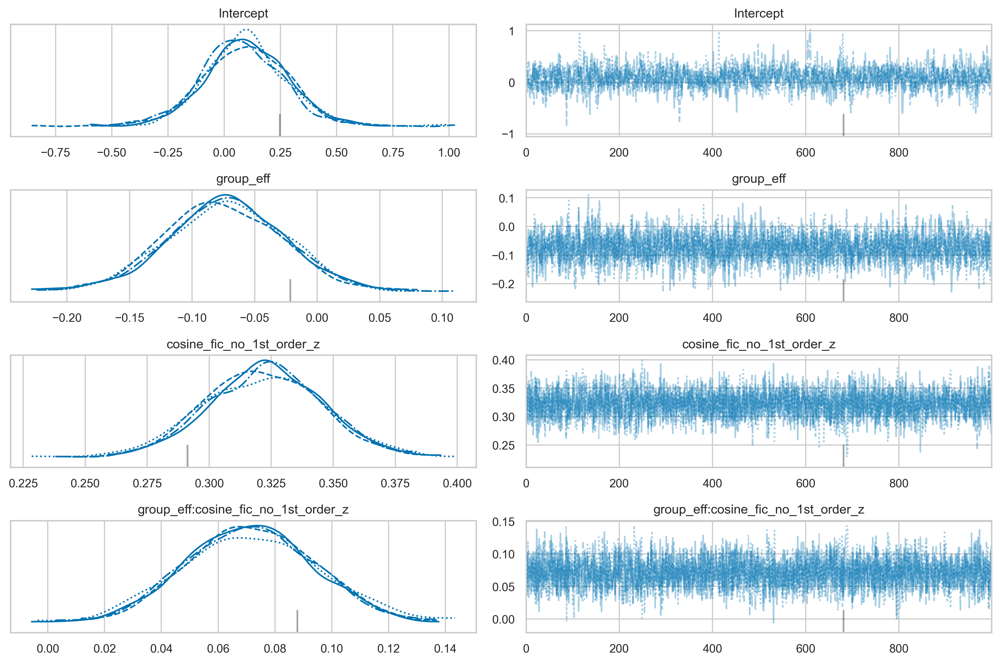

In [19]:
g = az.plot_trace(r_fic_filtered, var_names=['Intercept',
                                             'group_eff',
                                             'cosine_fic_no_1st_order_z',
                                             'group_eff:cosine_fic_no_1st_order_z'])
plt.tight_layout()

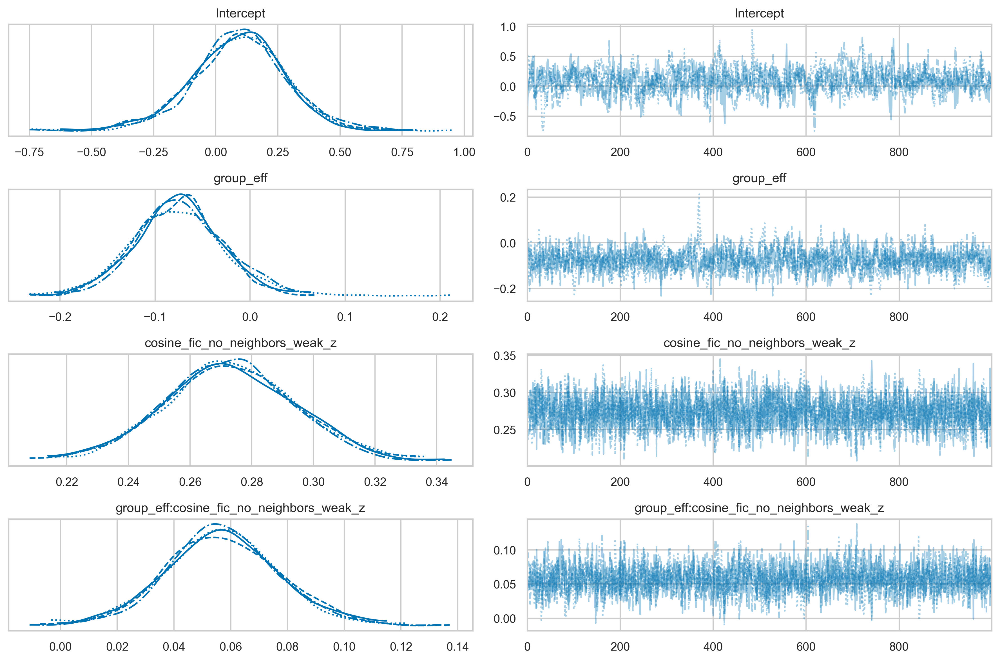

In [20]:
g = az.plot_trace(r_fic_noneighbors_weak, var_names=['Intercept',
                                                     'group_eff',
                                                     'cosine_fic_no_neighbors_weak_z',
                                                     'group_eff:cosine_fic_no_neighbors_weak_z'])
plt.tight_layout()

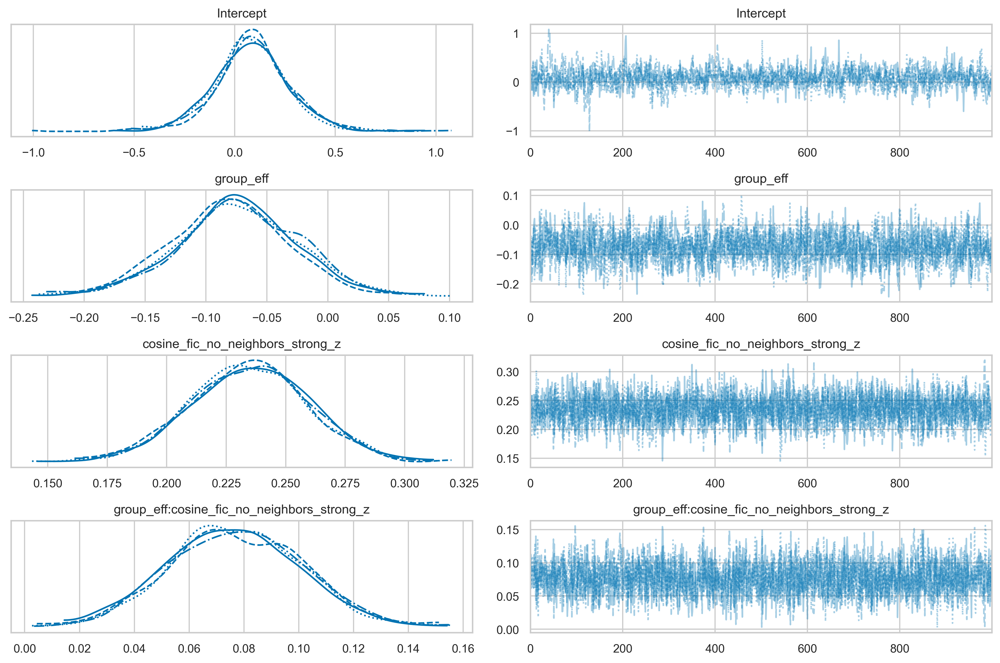

In [18]:
g = az.plot_trace(r_fic_noneighbors_strong, var_names=['Intercept',
                                                       'group_eff',
                                                       'cosine_fic_no_neighbors_strong_z',
                                                       'group_eff:cosine_fic_no_neighbors_strong_z'])
plt.tight_layout()

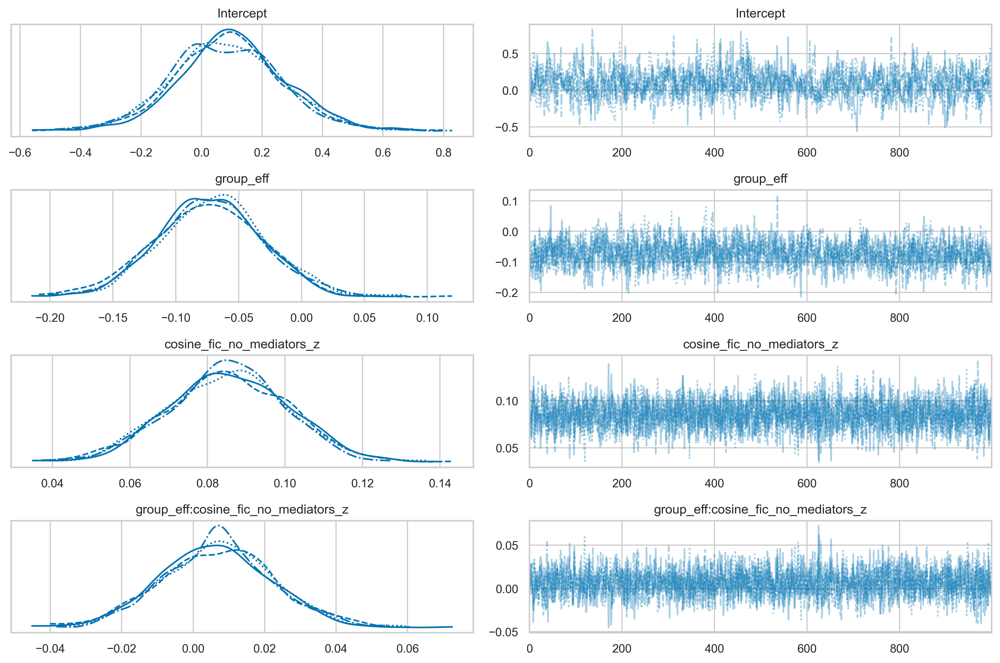

In [22]:
g = az.plot_trace(r_fic_nonames, var_names=['Intercept',
                                            'group_eff',
                                            'cosine_fic_no_mediators_z',
                                            'group_eff:cosine_fic_no_mediators_z'])
plt.tight_layout()

### Cumulative posterior predictive check
Check if the model's predictions line up with the predictions in our observed data (i.e. there are no weird biases etc.)

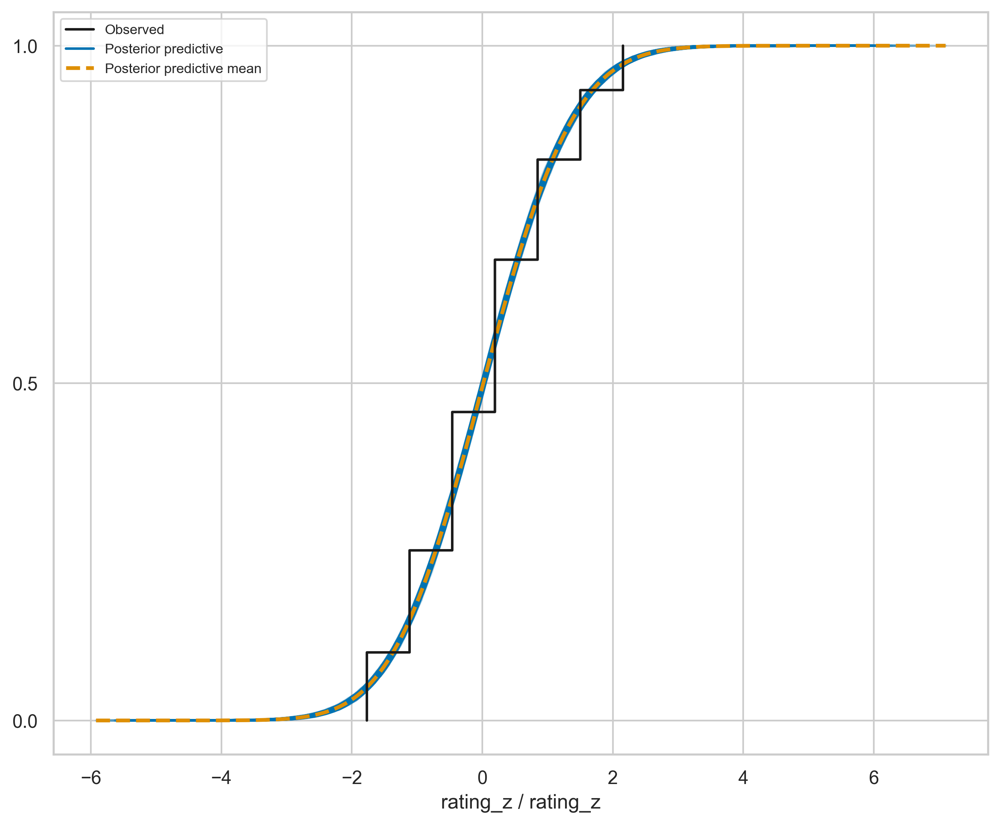

In [23]:
m_fic.predict(r_fic, kind='pps')
g = az.plot_ppc(r_fic, kind='cumulative')

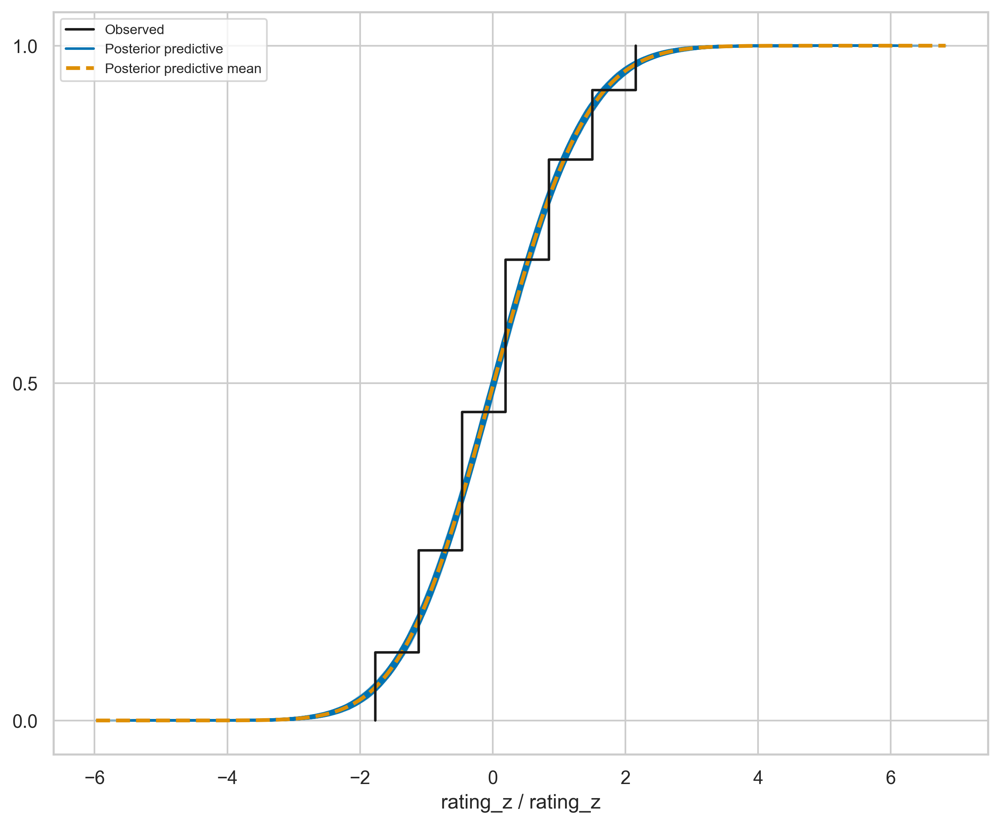

In [24]:
m_fic_filtered.predict(r_fic_filtered, kind='pps')
g = az.plot_ppc(r_fic_filtered, kind='cumulative')

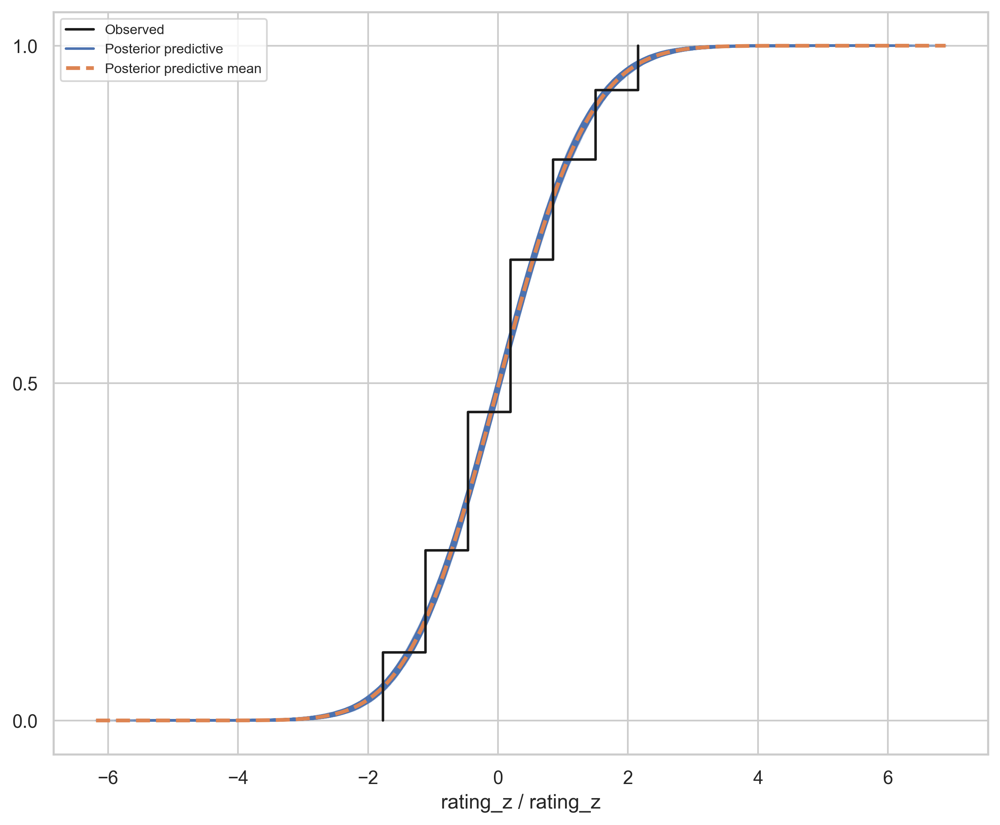

In [4]:
m_fic_noneighbors_weak.predict(r_fic_noneighbors_weak, kind='pps')
g = az.plot_ppc(r_fic_noneighbors_weak, kind='cumulative')

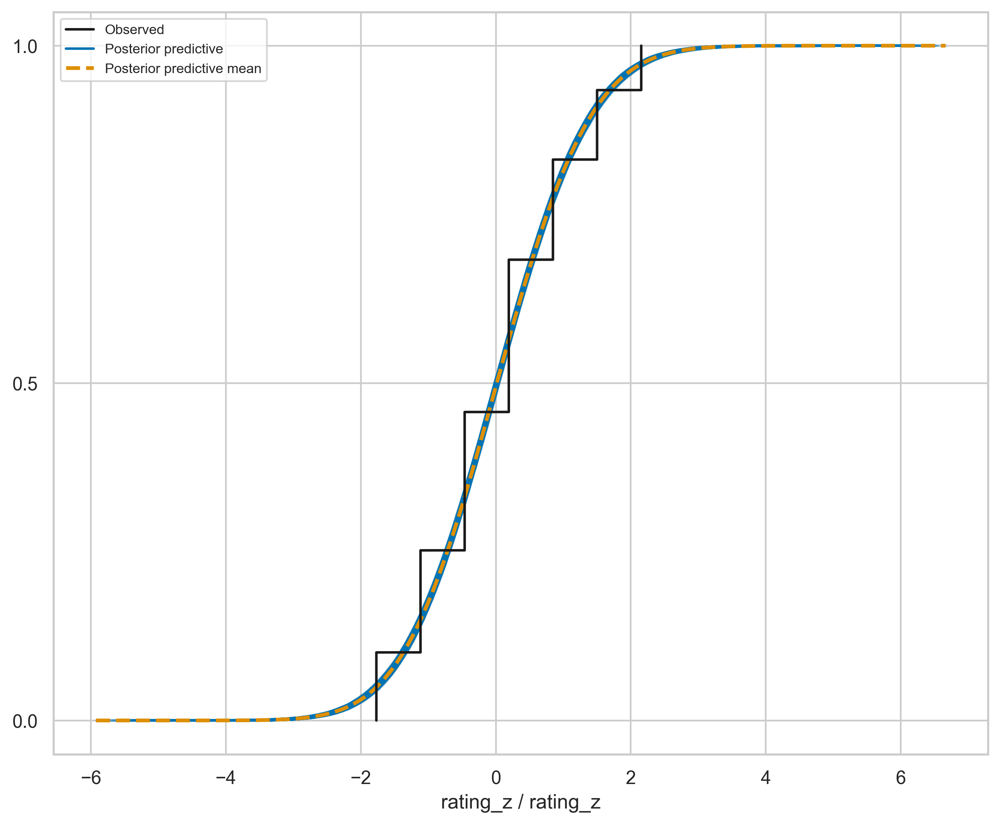

In [19]:
m_fic_noneighbors_strong.predict(r_fic_noneighbors_strong, kind='pps')
g = az.plot_ppc(r_fic_noneighbors_strong, kind='cumulative')

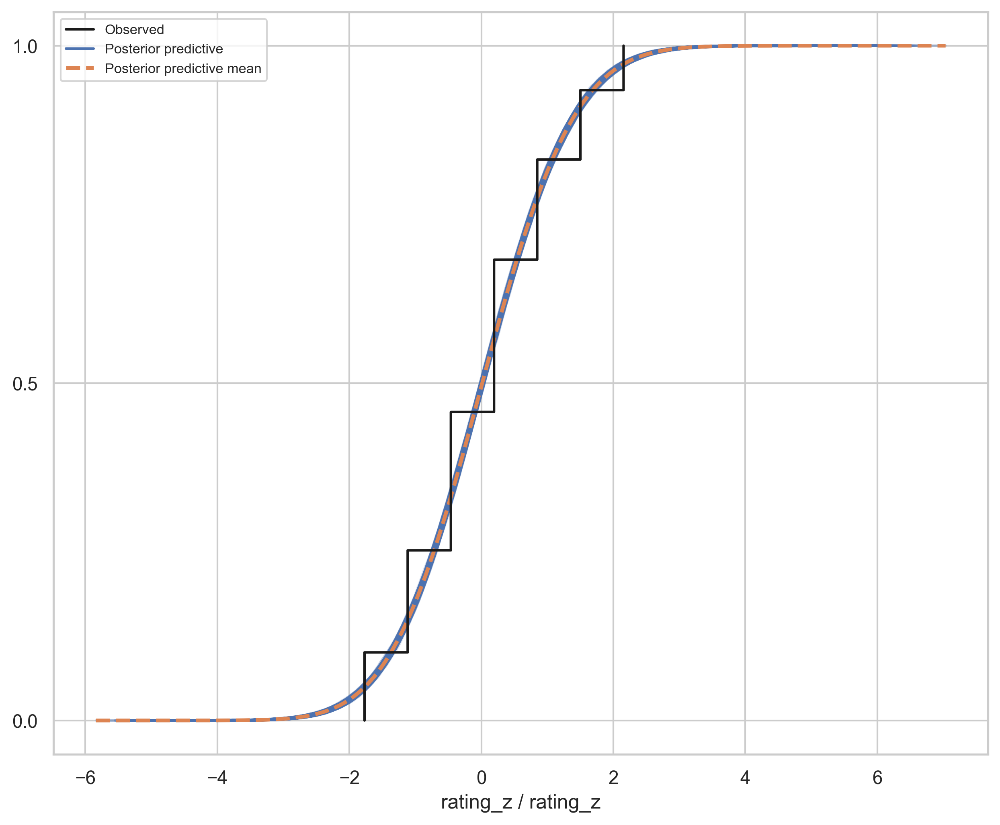

In [7]:
m_fic_nonames.predict(r_fic_nonames, kind='pps')
g = az.plot_ppc(r_fic_nonames, kind='cumulative')

# Convert notebook to html

In [2]:
convert_notebook('experiment_3')

[NbConvertApp] Converting notebook experiment_3.ipynb to html
[NbConvertApp] Writing 13986961 bytes to experiment_3.html


Jupyter notebook `experiment_3` converted successfully.